In [2]:
import pandas as pd # для загрузки датасета(csv)
import numpy as np # численные вычисления и работа с массивами
import matplotlib.pyplot as plt # построение графиков и визуализация
import seaborn as sns # статистическая визуализация

In [3]:
train_file_path = r"C:\Practice\data\train.csv"
train_df = pd.read_csv(train_file_path)

In [4]:
train_df.shape # размерность датасета
# print("Full train dataset shape is {}".format(dataset_df.shape))

(1460, 81)

In [5]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
train_df.info() # информация о датасете

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
train_df.dtypes # показывает типы данных столбцов

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [8]:
list(set(train_df.dtypes.tolist())) # уникальные типы данных в датасете

[dtype('int64'), dtype('float64'), dtype('O')]

In [9]:
train_df.isnull().any().any()# есть пропуски

np.True_

In [10]:
train_df_filled = train_df.fillna(train_df.mean(numeric_only = True)).fillna("Unknown")

In [80]:
print(train_df.duplicated().sum()) # дубликатов нет
print(train_df_filled.duplicated().sum())

0
0


In [11]:
numeric_cols = train_df_filled.select_dtypes(include = 'number').columns
print(numeric_cols[:3]) # находим столбцы с численными признаками
print(len(numeric_cols))

Index(['Id', 'MSSubClass', 'LotFrontage'], dtype='object')
38


In [82]:
def outlier(df, n):
    outliers = []

    for col in numeric_cols:
        if df[col].nunique() <= 2 or col == 'SalePrice':
            continue
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1 # мера разброса данных

        low = Q1 - 1.5 * IQR
        up = Q3 + 1.5 * IQR

        outliers_count = len(df[(df[col] < low) | (df[col] > up)])
        outlier_percentage = (outliers_count / len(df)) * 100
        outliers.append({
            'Признак': col,
            'Кол-во выбросов': outliers_count,
            'Процент выбросов': outlier_percentage,
            'Мин': df[col].min(),
            'Макс': df[col].max(),
            'Медиана': df[col].median(),
            'Асимметрия': df[col].skew()
        })
    
    # Сортируем по количеству выбросов (по убыванию: ascending=False)
    result_df = pd.DataFrame(outliers)
    result_df = result_df.sort_values('Кол-во выбросов', ascending=False)
    return result_df.head(n)

# Получаем топ-20 признаков с выбросами
top_outliers = outlier(train_df_filled, 20)
print("ТОП-20 признаков с наибольшим количеством выбросов:\n")
print(top_outliers.to_string(index=False))
        
        
        
        

ТОП-20 признаков с наибольшим количеством выбросов:

      Признак  Кол-во выбросов  Процент выбросов    Мин     Макс     Медиана  Асимметрия
EnclosedPorch              208         14.246575    0.0    552.0    0.000000    3.089872
   BsmtFinSF2              167         11.438356    0.0   1474.0    0.000000    4.255261
  OverallCond              125          8.561644    1.0      9.0    5.000000    0.693067
  ScreenPorch              116          7.945205    0.0    480.0    0.000000    4.122214
  LotFrontage              106          7.260274   21.0    313.0   70.049958    2.384950
   MSSubClass              103          7.054795   20.0    190.0   50.000000    1.407657
   MasVnrArea               98          6.712329    0.0   1600.0    0.000000    2.676412
 BsmtHalfBath               82          5.616438    0.0      2.0    0.000000    4.103403
  OpenPorchSF               77          5.273973    0.0    547.0   25.000000    2.364342
      LotArea               69          4.726027 1300.0 2

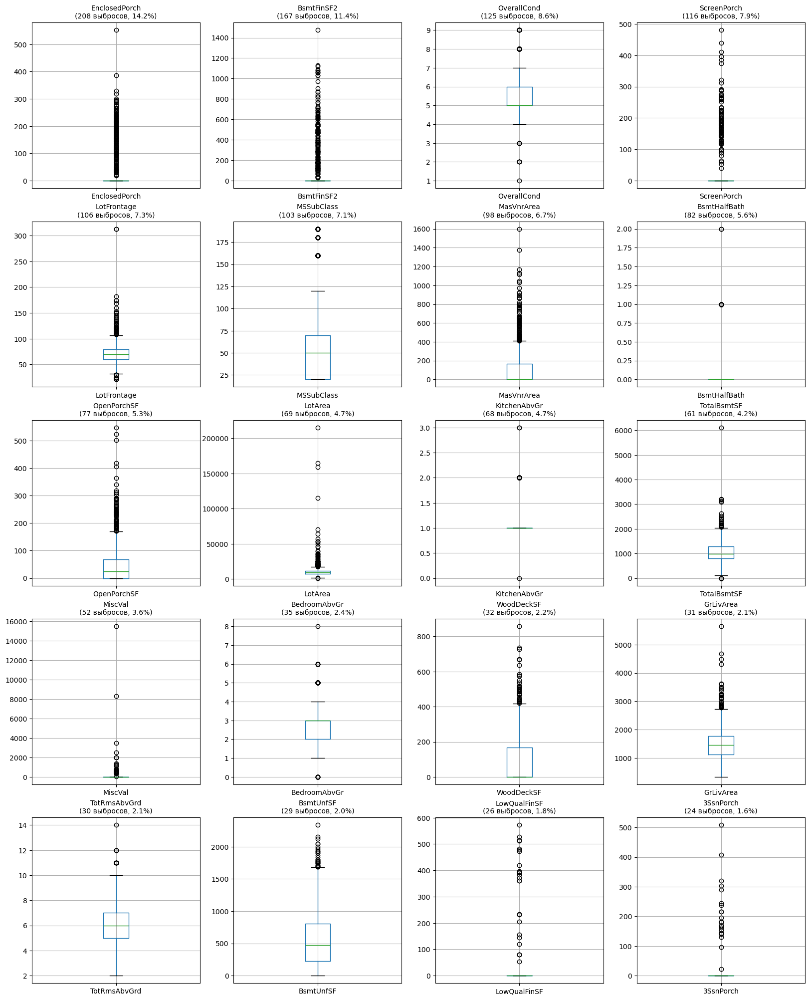

In [83]:
top_features = top_outliers['Признак'].tolist()

n_cols = 4  # 4 графика в строке
n_rows = (len(top_features) + n_cols - 1) // n_cols  # Округление вверх

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()


for i, col in enumerate(top_features):
    # Box plot через pandas
    train_df_filled.boxplot(column=col, ax=axes[i])
    
    # Добавляем информацию о выбросах из нашего анализа
    outliers_info = top_outliers[top_outliers['Признак'] == col]
    outliers_count = outliers_info['Кол-во выбросов'].values[0]
    outliers_percent = outliers_info['Процент выбросов'].values[0]
    
    axes[i].set_title(f'{col}\n({outliers_count} выбросов, {outliers_percent:.1f}%)', 
                     fontsize=10)
    axes[i].tick_params(axis='x', rotation=0)



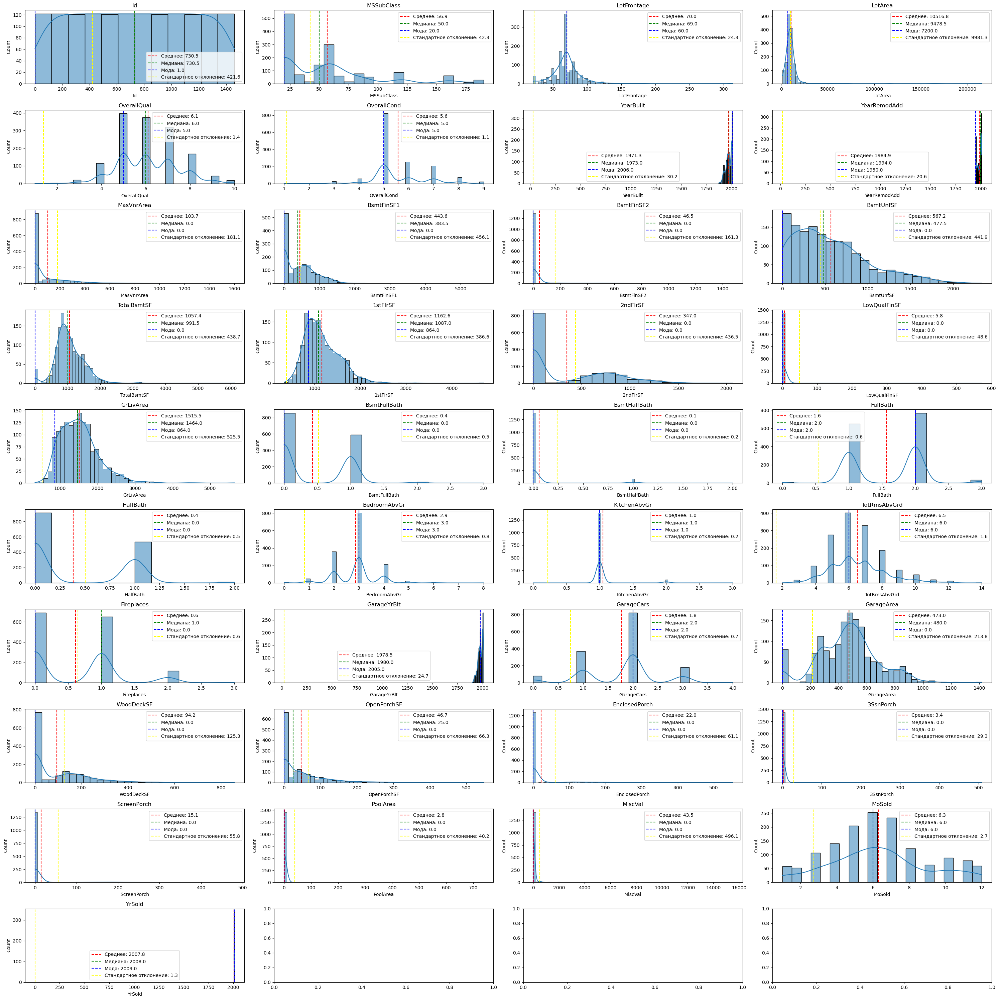

In [84]:
fig, axes = plt.subplots(10, 4, figsize = (30, 30))
axes = axes.ravel()

for i, col in enumerate(numeric_cols):
    if col == 'SalePrice':
        continue
        
    sns.histplot(train_df_filled[col], kde = True, ax = axes[i]) # KDE - Kernel Density Estimation - кривая плотности распределения
    axes[i].set_title(col)

    axes[i].axvline(train_df_filled[col].mean(), color='red', linestyle='--', label=f'Среднее: {train_df[col].mean():.1f}')
    axes[i].axvline(train_df_filled[col].median(), color='green', linestyle='--', label=f'Медиана: {train_df[col].median():.1f}')
    axes[i].axvline(train_df_filled[col].mode()[0], color = 'blue', linestyle='--', label=f'Мода: {train_df[col].mode()[0]:.1f}')
    axes[i].axvline(train_df_filled[col].std(), color = 'yellow', linestyle='--', label=f'Стандартное отклонение: {train_df[col].std():.1f}')
    
    axes[i].legend()
plt.tight_layout() # автоматическая регулировка расстояния м/у графиками
plt.show() # отображение графиков 

In [85]:
categorical_cols = train_df_filled.select_dtypes(include = 'object').columns
print(categorical_cols)
print(len(categorical_cols))

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')
43


In [86]:
train_df_filled['PoolQC'].value_counts()

PoolQC
Unknown    1453
Gd            3
Ex            2
Fa            2
Name: count, dtype: int64

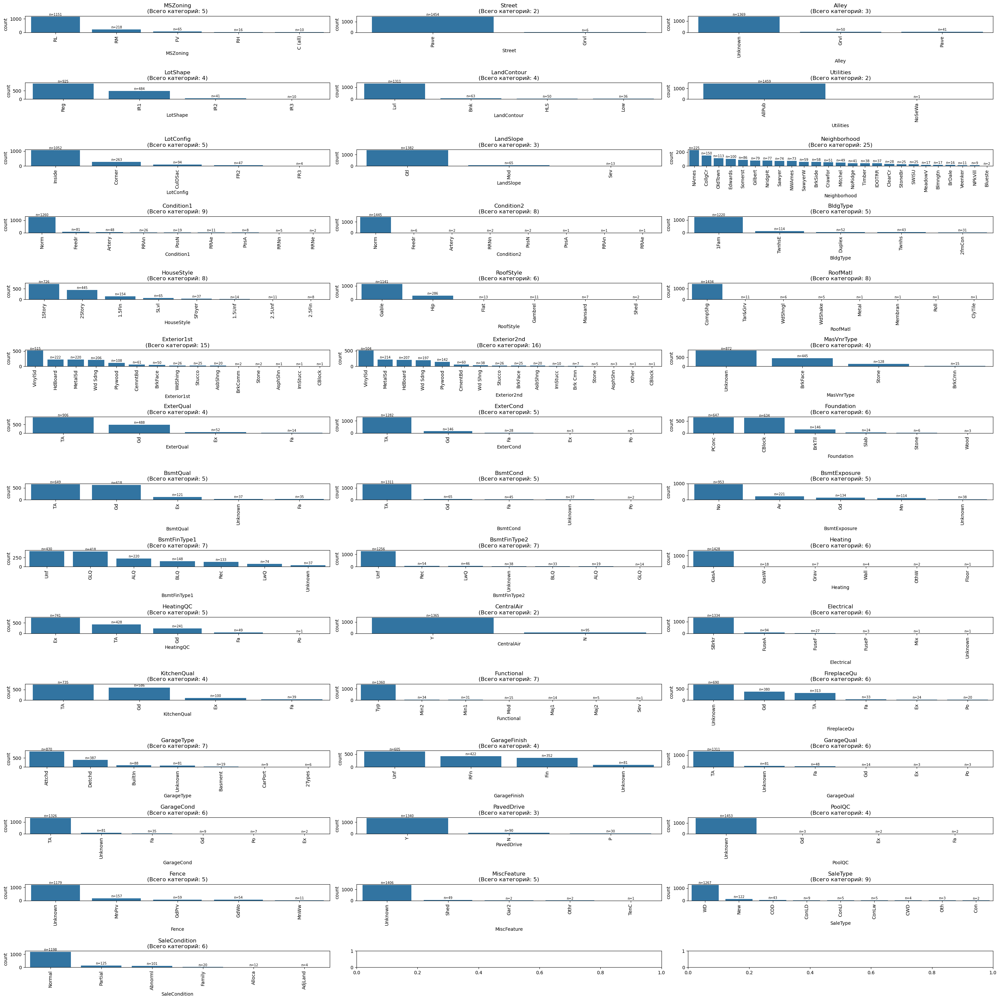

In [87]:

fig, axes = plt.subplots(15, 3, figsize=(30, 30))
axes = axes.ravel()

for i, col in enumerate(categorical_cols):
    value_counts = train_df_filled[col].value_counts()
    sns.countplot(data=train_df_filled, x=col, ax=axes[i], order=value_counts.index)
        
    axes[i].set_title(f'{col}\n(Всего категорий: {len(value_counts)})')
    axes[i].set_xlabel(col)
    #axes[i].set_ylabel('Количество')
    axes[i].tick_params(axis='x', rotation=90)

    # value_counts.items() - [('Category_A', 150), ('Category_B', 80), ('Category_C', 30)]
    for j, (category, count) in enumerate(value_counts.items()): # [(0, ('Category_A', 150)), (1, ('Category_B', 80)),(2, ('Category_C', 30))]
        # axes[i].text(x, y, text_string, **kwargs)
        axes[i].text(j, count + 0.02 * max(value_counts), 
                    f'n={count}',
                    ha='center', va='bottom', fontsize=7)

plt.tight_layout()
plt.show()

Описание целевой переменной
Целевая переменная: SalePrice
Тип данных: int64
Размерность: (1460,)

--- Описательная статистика ---
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


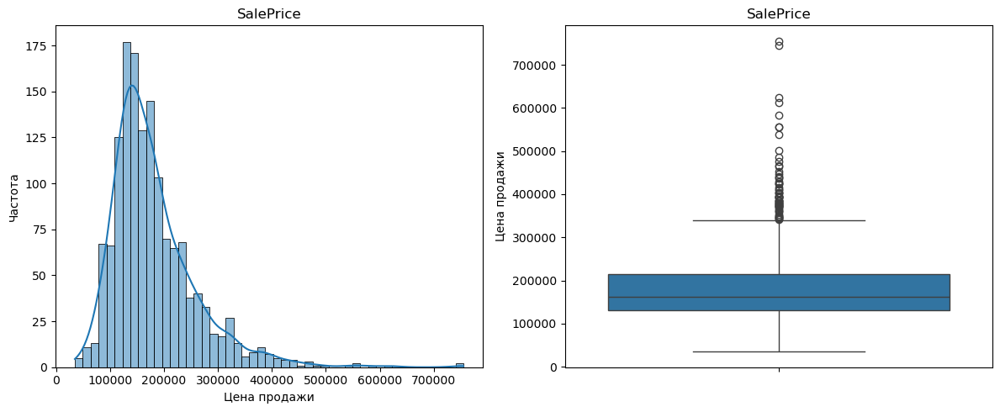

In [88]:
target_variable = 'SalePrice'

print("Описание целевой переменной")
print(f"Целевая переменная: {target_variable}")
print(f"Тип данных: {train_df[target_variable].dtype}")
print(f"Размерность: {train_df[target_variable].shape}")

# Описательная статистика
print("\n--- Описательная статистика ---")
print(train_df[target_variable].describe())

# Визуализация распределения
plt.figure(figsize=(12, 5))

# Гистограмма
plt.subplot(1, 2, 1)
sns.histplot(train_df[target_variable], kde=True)
plt.title(target_variable)
plt.xlabel('Цена продажи')
plt.ylabel('Частота')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=train_df[target_variable])
plt.title(target_variable)
plt.ylabel('Цена продажи')

plt.tight_layout()
plt.show()

Двумерный анализ для числовых признаков



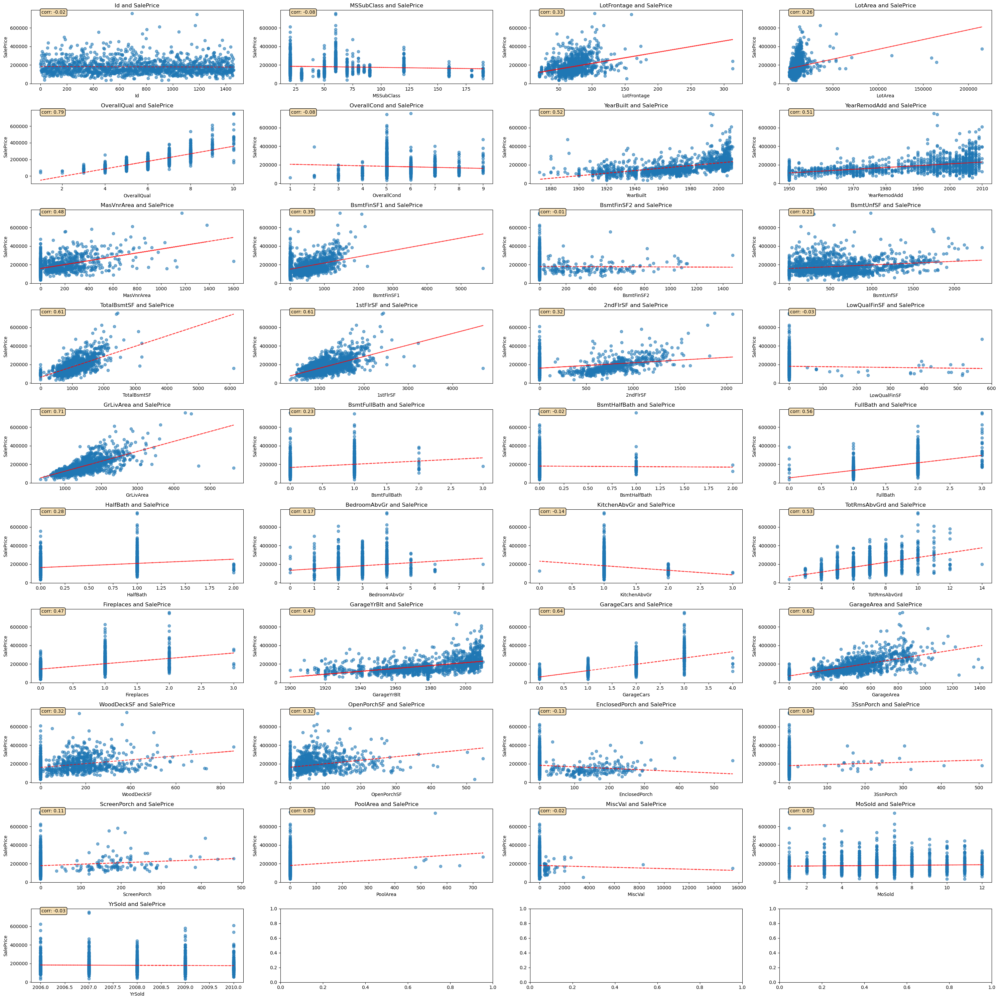

In [90]:
print("Двумерный анализ для числовых признаков\n")

fig, axes = plt.subplots(10, 4, figsize = (30, 30))
axes = axes.ravel()

for i, col in enumerate(numeric_cols):
    if col == 'SalePrice':
        continue
        
    # Scatter plot
    axes[i].scatter(train_df_filled[col], train_df_filled[target_variable], alpha=0.6)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel(target_variable)
    axes[i].set_title(f'{col} and {target_variable}')
    # Линия тренда
    z = np.polyfit(train_df_filled[col], train_df_filled[target_variable], 1)
    p = np.poly1d(z)
    axes[i].plot(train_df_filled[col], p(train_df[col]), "r--", alpha=0.8)
        
    # Коэффициент корреляции
    corr = train_df_filled[col].corr(train_df_filled[target_variable])
    axes[i].text(0.05, 0.95, f'corr: {corr:.2f}', 
                transform=axes[i].transAxes, bbox=dict(boxstyle="round", facecolor="wheat"))
    
plt.tight_layout() 
plt.show() 


Двумерный анализ для категориальных признаков



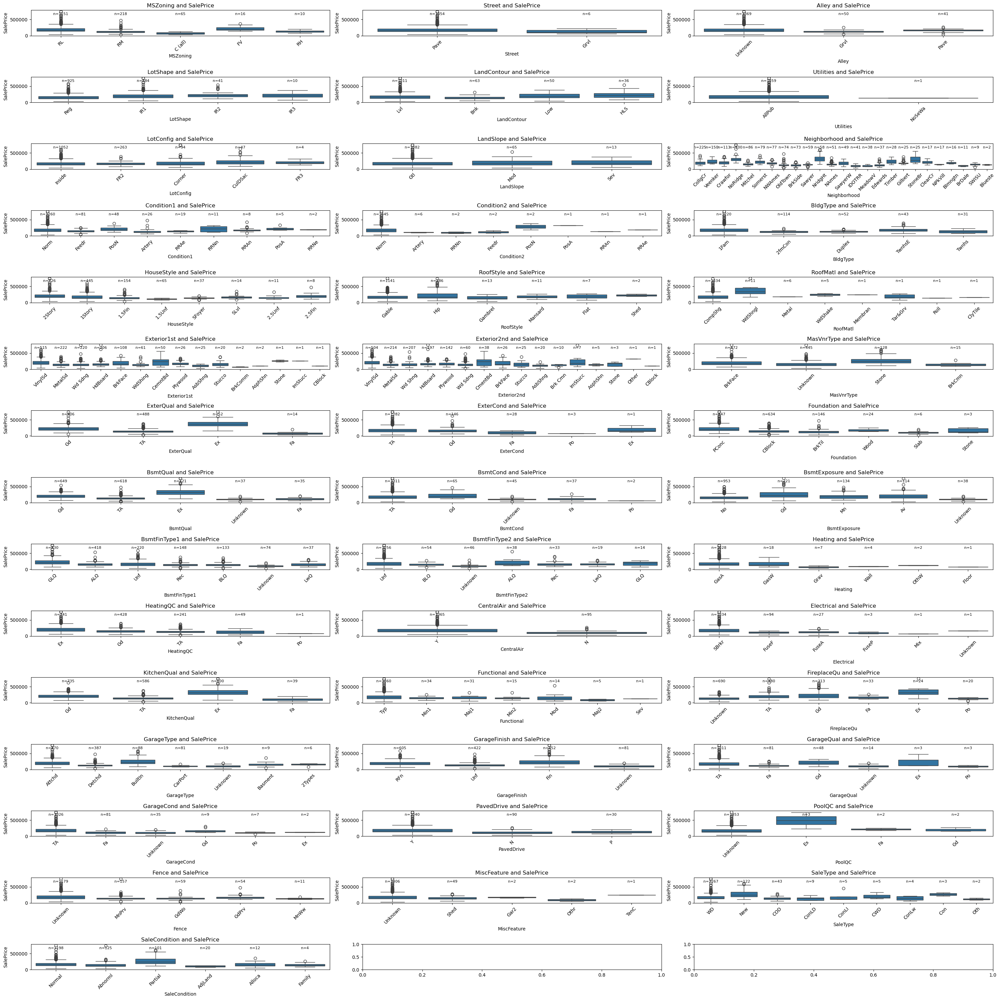

In [139]:
print("Двумерный анализ для категориальных признаков\n")

fig, axes = plt.subplots(15, 3, figsize=(30, 30))
axes = axes.ravel()

for i, col in enumerate(categorical_cols):
    # Boxplot
    sns.boxplot(data=train_df_filled, x=col, y=target_variable, ax=axes[i])
    axes[i].set_title(f'{col} and {target_variable}')
    axes[i].tick_params(axis='x', rotation=45)
        
    value_counts = train_df_filled[col].value_counts()
    for j, (category, count) in enumerate(value_counts.items()):
        axes[i].text(j, train_df_filled[target_variable].max() * 0.95, 
                    f'n={count}', ha='center', va='top', fontsize=8)

plt.tight_layout()
plt.show()

Корреляционный анализ для числовых признаков


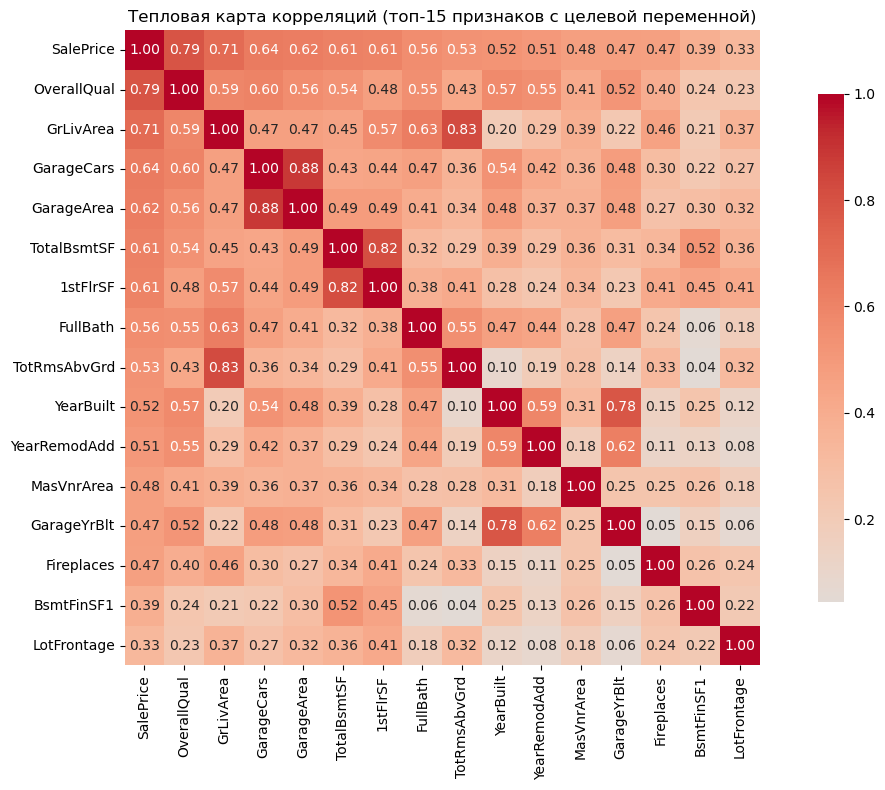


Топ-15 признаков по корреляции с целевой переменной
1. OverallQual: 0.791
2. GrLivArea: 0.709
3. GarageCars: 0.640
4. GarageArea: 0.623
5. TotalBsmtSF: 0.614
6. 1stFlrSF: 0.606
7. FullBath: 0.561
8. TotRmsAbvGrd: 0.534
9. YearBuilt: 0.523
10. YearRemodAdd: 0.507
11. MasVnrArea: 0.475
12. GarageYrBlt: 0.470
13. Fireplaces: 0.467
14. BsmtFinSF1: 0.386
15. LotFrontage: 0.335


In [131]:
print("Корреляционный анализ для числовых признаков")

# Создаем корреляционную матрицу
correlation_matrix = train_df_filled[numeric_cols].corr()

# Тепловая карта корреляций с целевой переменной
plt.figure(figsize=(12, 8))

# Сортируем признаки по корреляции с целевой переменной
target_correlations = correlation_matrix[target_variable].sort_values(ascending=False)

# Берем топ-15 признаков по корреляции
top_features = target_correlations.head(16).index  # 15 + целевая переменная

# Создаем уменьшенную матрицу корреляций
corr_top = train_df_filled[top_features].corr()

# Тепловая карта
#mask = np.triu(np.ones_like(corr_top, dtype=bool))  # Маска для верхнего треугольника
sns.heatmap(corr_top, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.2f', cbar_kws={"shrink": .8})
plt.title('Тепловая карта корреляций (топ-15 признаков с целевой переменной)')
plt.tight_layout()
plt.show()

# Выводим топ коррелирующих признаков
print("\nТоп-15 признаков по корреляции с целевой переменной")
for i, (col, corr) in enumerate(target_correlations.head(16).items()):
    if col != target_variable:  # Исключаем самосогласованность
        print(f"{i}. {col}: {corr:.3f}")

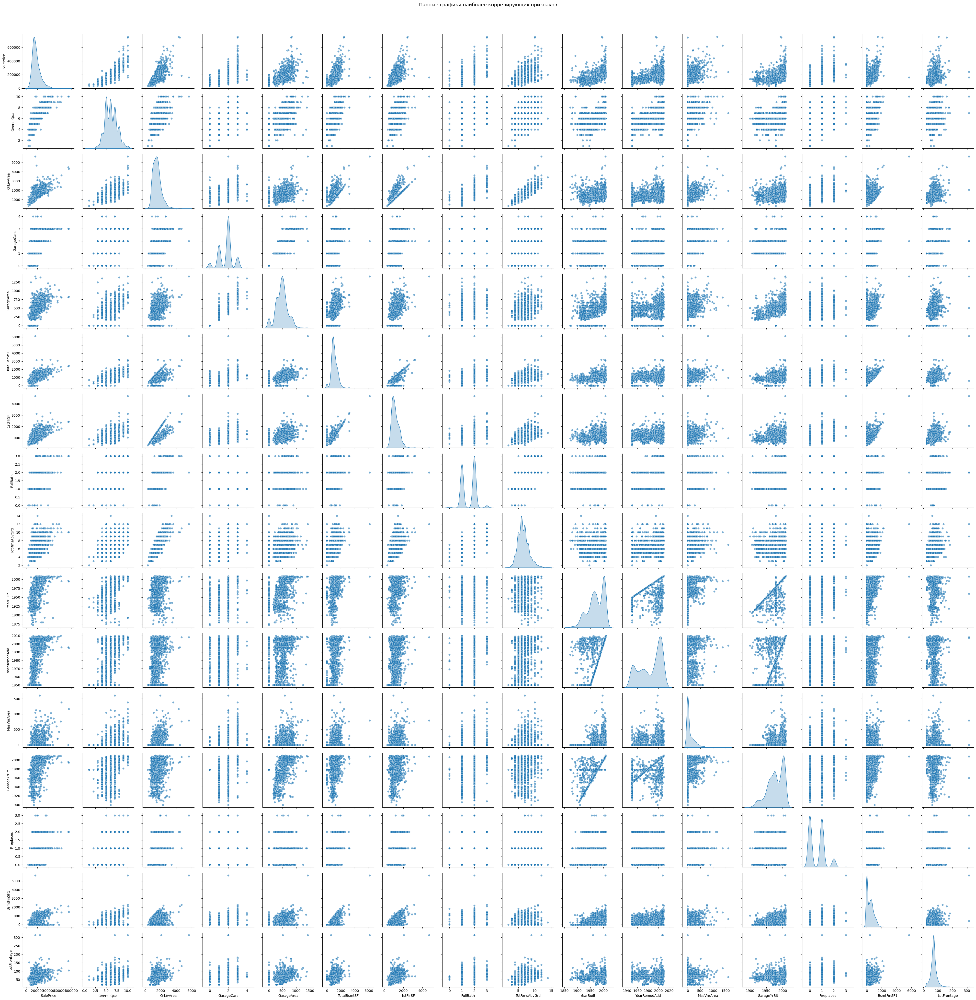

In [132]:
#print("Парные графики")

# Выбираем наиболее коррелирующие признаки для pairplot
top_corr_features = target_correlations.head(16).index.tolist()

# Создаем pairplot
pair_grid = sns.pairplot(train_df_filled[top_corr_features], diag_kind='kde', 
             plot_kws={'alpha': 0.6}, diag_kws={'fill': True})

for ax in pair_grid.axes.flat:
    if ax is not None:
        # Подписи оси X
        ax.set_xlabel(ax.get_xlabel(), fontsize=10, rotation=0)
        # Подписи оси Y
        ax.set_ylabel(ax.get_ylabel(), fontsize=10, rotation=90)

    
plt.suptitle('Парные графики наиболее коррелирующих признаков', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

=== ПАРАЛЛЕЛЬНЫЕ КООРДИНАТЫ: ТОП КОРРЕЛИРУЮЩИЕ ПРИЗНАКИ ===
Используемые признаки:
1. OverallQual
2. GrLivArea
3. GarageCars
4. TotalBsmtSF
5. YearBuilt
6. FullBath


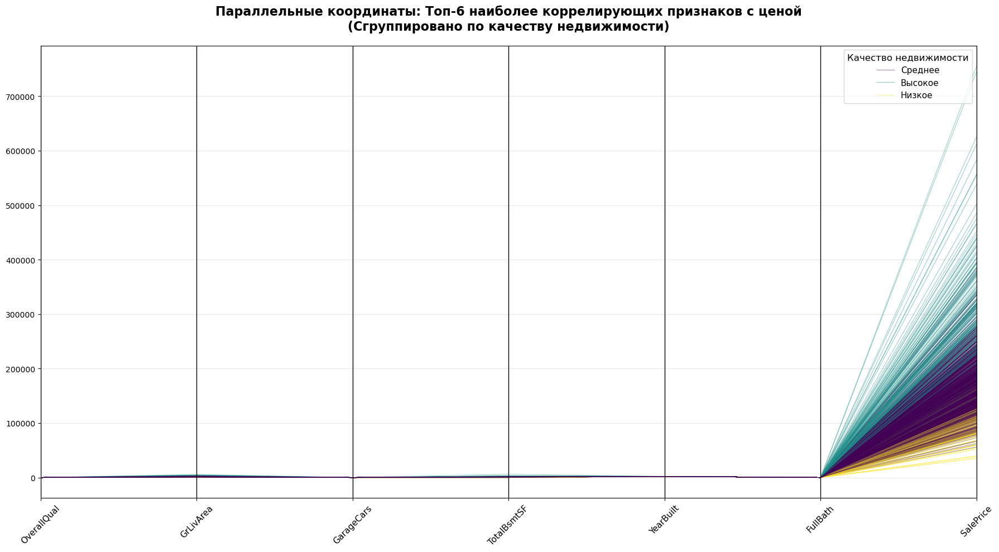


СТАТИСТИКА ПО ГРУППАМ КАЧЕСТВА:
               count       mean    median       std
Quality_Group                                      
Низкое           141  103417.60  105000.0  30560.18
Среднее         1090  164871.42  157900.0  46801.22
Высокое          229  305035.90  285000.0  94509.49


In [136]:
from pandas.plotting import parallel_coordinates
print("=== ПАРАЛЛЕЛЬНЫЕ КООРДИНАТЫ: ТОП КОРРЕЛИРУЮЩИЕ ПРИЗНАКИ ===")

# Берем топ-6 признаков (исключая дубликаты и слишком похожие)
top_features = ['OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'YearBuilt', 'FullBath']

print("Используемые признаки:")
for i, feature in enumerate(top_features, 1):
    print(f"{i}. {feature}")

# Создаем категории на основе качества (самый важный признак)
train_df_filled['Quality_Group'] = pd.cut(train_df_filled['OverallQual'], 
                                        bins=[0, 4, 7, 10], 
                                        labels=['Низкое', 'Среднее', 'Высокое'])

# Формируем финальный набор
features_for_parallel = top_features + ['SalePrice', 'Quality_Group']

# Создаем параллельные координаты
plt.figure(figsize=(18, 10))
parallel_coordinates(train_df_filled[features_for_parallel], 
                    'Quality_Group', 
                    colormap='viridis', 
                    alpha=0.5,
                    linewidth=0.7)

plt.title('Параллельные координаты: Топ-6 наиболее коррелирующих признаков с ценой\n'
          '(Сгруппировано по качеству недвижимости)', 
          fontsize=16, fontweight='bold', pad=20)

plt.xticks(rotation=45, fontsize=11)
plt.yticks(fontsize=10)
plt.grid(True, alpha=0.3)
plt.legend(title='Качество недвижимости', title_fontsize=12, fontsize=11, 
           loc='upper right')

plt.tight_layout()
plt.show()

# Статистика по группам
print(f"\nСТАТИСТИКА ПО ГРУППАМ КАЧЕСТВА:")
group_stats = train_df_filled.groupby('Quality_Group', observed=True)['SalePrice'].agg([
    'count', 'mean', 'median', 'std'
]).round(2)
print(group_stats)

=== АНАЛИЗ ЗАКОНОМЕРНОСТЕЙ ===


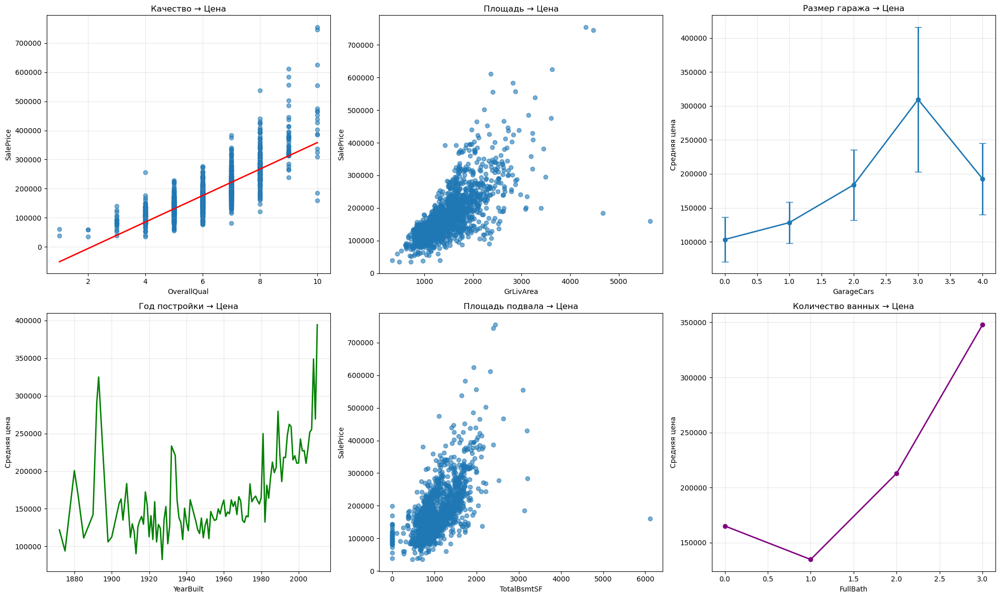

In [143]:
print("=== АНАЛИЗ ЗАКОНОМЕРНОСТЕЙ ===")

# Создаем комплексную визуализацию закономерностей
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Закономерность 1: Качество → Цена (ваш топ-1 признак)
axes[0, 0].scatter(train_df_filled['OverallQual'], train_df_filled['SalePrice'], alpha=0.6) # точечный график
axes[0, 0].set_xlabel('OverallQual')
axes[0, 0].set_ylabel('SalePrice')
axes[0, 0].set_title('Качество → Цена')
axes[0, 0].grid(True, alpha=0.3)

# Добавляем линию тренда для качества
z_qual = np.polyfit(train_df_filled['OverallQual'], train_df_filled['SalePrice'], 1) # вычисление коэффициентов линейной регрессии
p_qual = np.poly1d(z_qual)
x_range = np.linspace(train_df_filled['OverallQual'].min(), train_df_filled['OverallQual'].max(), 100)
axes[0, 0].plot(x_range, p_qual(x_range), 'r-', linewidth=2)

# Закономерность 2: Площадь → Цена
axes[0, 1].scatter(train_df_filled['GrLivArea'], train_df_filled['SalePrice'], alpha=0.6)
axes[0, 1].set_xlabel('GrLivArea')
axes[0, 1].set_ylabel('SalePrice')
axes[0, 1].set_title('Площадь → Цена')

# Закономерность 3: Гараж → Цена
garage_price = train_df_filled.groupby('GarageCars')['SalePrice'].agg(['mean', 'std'])
axes[0, 2].errorbar(garage_price.index, garage_price['mean'], yerr=garage_price['std'], 
                   fmt='o-', capsize=5, linewidth=2)
axes[0, 2].set_xlabel('GarageCars')
axes[0, 2].set_ylabel('Средняя цена')
axes[0, 2].set_title('Размер гаража → Цена')
axes[0, 2].grid(True, alpha=0.3)

# Закономерность 4: Год постройки → Цена
year_price = train_df_filled.groupby('YearBuilt')['SalePrice'].mean()
axes[1, 0].plot(year_price.index, year_price.values, 'g-', linewidth=2)
axes[1, 0].set_xlabel('YearBuilt')
axes[1, 0].set_ylabel('Средняя цена')
axes[1, 0].set_title('Год постройки → Цена')
axes[1, 0].grid(True, alpha=0.3)

# Закономерность 5: Подвал → Цена
axes[1, 1].scatter(train_df_filled['TotalBsmtSF'], train_df_filled['SalePrice'], alpha=0.6)
axes[1, 1].set_xlabel('TotalBsmtSF')
axes[1, 1].set_ylabel('SalePrice')
axes[1, 1].set_title('Площадь подвала → Цена')

# Закономерность 6: Ванные → Цена
bath_price = train_df_filled.groupby('FullBath')['SalePrice'].mean()
axes[1, 2].plot(bath_price.index, bath_price.values, 'purple', marker='o', linewidth=2)
axes[1, 2].set_xlabel('FullBath')
axes[1, 2].set_ylabel('Средняя цена')
axes[1, 2].set_title('Количество ванных → Цена')
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



=== АНАЛИЗ ТРЕНДОВ ===


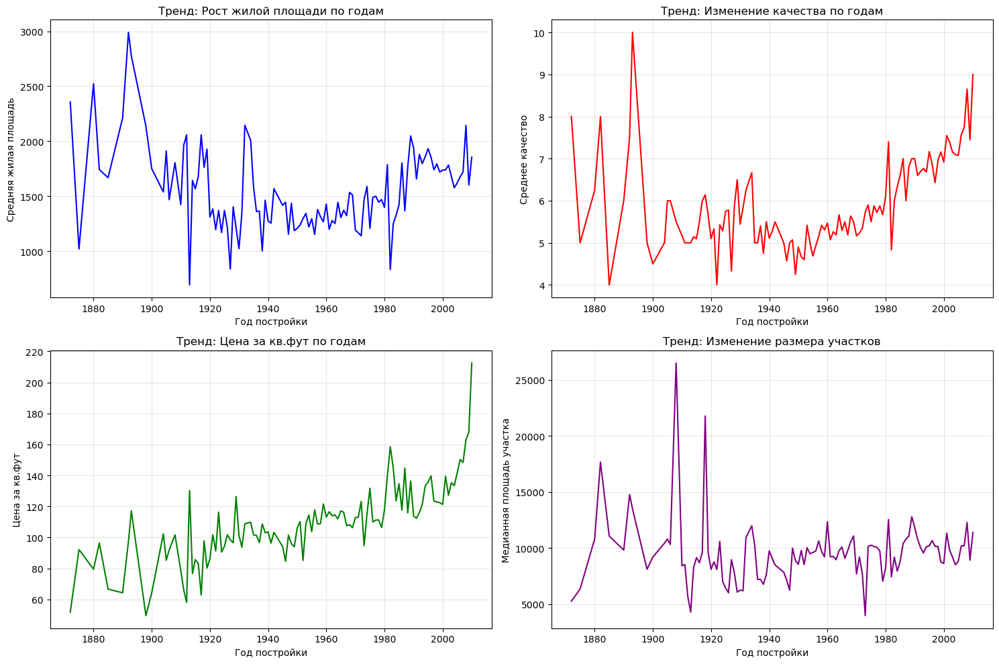

In [129]:
print("\n=== АНАЛИЗ ТРЕНДОВ ===")

# Тренд 1: Эволюция характеристик во времени
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Тренд площади по годам
year_area = train_df_filled.groupby('YearBuilt')['GrLivArea'].mean()
axes[0, 0].plot(year_area.index, year_area.values, 'b-')
axes[0, 0].set_title('Тренд: Рост жилой площади по годам')
axes[0, 0].set_xlabel('Год постройки')
axes[0, 0].set_ylabel('Средняя жилая площадь')
axes[0, 0].grid(True, alpha=0.3)

# Тренд качества по годам
year_quality = train_df_filled.groupby('YearBuilt')['OverallQual'].mean()
axes[0, 1].plot(year_quality.index, year_quality.values, 'r-')
axes[0, 1].set_title('Тренд: Изменение качества по годам')
axes[0, 1].set_xlabel('Год постройки')
axes[0, 1].set_ylabel('Среднее качество')
axes[0, 1].grid(True, alpha=0.3)

# Тренд цены 
price_data = train_df_filled.groupby('YearBuilt').agg({
    'SalePrice': 'mean',
    'GrLivArea': 'mean'
})
price_per_sqft = price_data['SalePrice'] / price_data['GrLivArea']

axes[1, 0].plot(price_per_sqft.index, price_per_sqft.values, 'g-')
axes[1, 0].set_title('Тренд: Цена за кв.фут по годам')
axes[1, 0].set_xlabel('Год постройки')
axes[1, 0].set_ylabel('Цена за кв.фут')
axes[1, 0].grid(True, alpha=0.3)

# Тренд размера участка
year_lot = train_df_filled.groupby('YearBuilt')['LotArea'].median()
axes[1, 1].plot(year_lot.index, year_lot.values, 'purple')
axes[1, 1].set_title('Тренд: Изменение размера участков')
axes[1, 1].set_xlabel('Год постройки')
axes[1, 1].set_ylabel('Медианная площадь участка')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



=== ВЫЯВЛЕНИЕ АНОМАЛИЙ ===


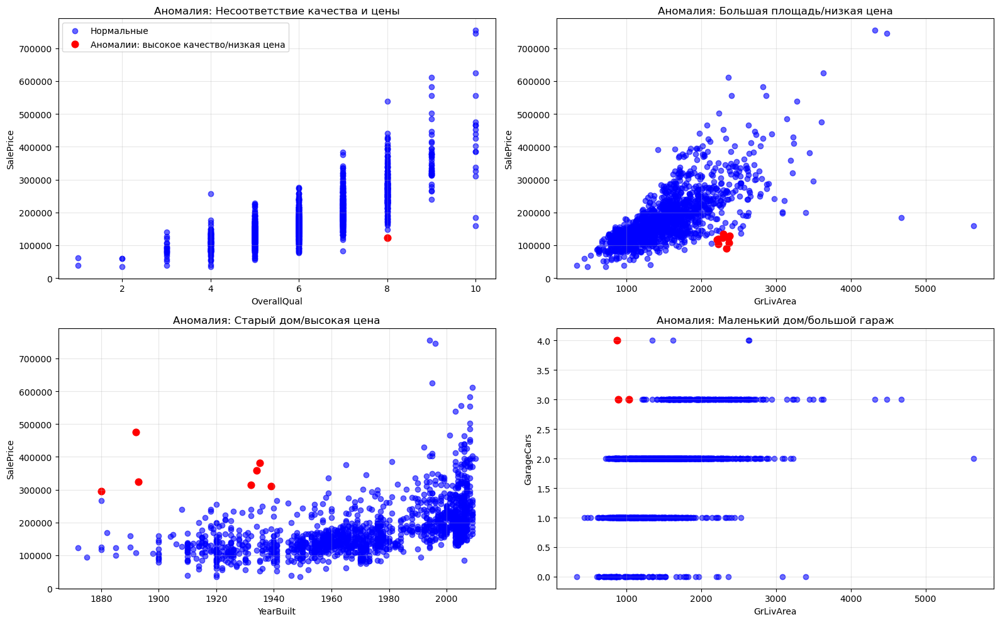

In [128]:
print("\n=== ВЫЯВЛЕНИЕ АНОМАЛИЙ ===")

def detect_anomalies(df):
    anomalies = []
    
    # Аномалия 1: Высокое качество, но низкая цена
    high_qual_low_price = df[
        (df['OverallQual'] >= 8) & 
        (df['SalePrice'] < df['SalePrice'].quantile(0.3))
    ]
    anomalies.append(('Высокое качество/низкая цена', high_qual_low_price))
    
    # Аномалия 2: Большая площадь, но низкая цена
    large_area_low_price = df[
        (df['GrLivArea'] > df['GrLivArea'].quantile(0.9)) & 
        (df['SalePrice'] < df['SalePrice'].quantile(0.3))
    ]
    anomalies.append(('Большая площадь/низкая цена', large_area_low_price))
    
    # Аномалия 3: Старый дом, но очень высокая цена
    old_high_price = df[
        (df['YearBuilt'] < 1950) & 
        (df['SalePrice'] > df['SalePrice'].quantile(0.9))
    ]
    anomalies.append(('Старый дом/высокая цена', old_high_price))
    
    # Аномалия 4: Маленький дом с большим гаражом
    small_house_big_garage = df[
        (df['GrLivArea'] < df['GrLivArea'].quantile(0.3)) & 
        (df['GarageCars'] >= 3)
    ]
    anomalies.append(('Маленький дом/большой гараж', small_house_big_garage))
    
    return anomalies

# Находим аномалии
anomalies = detect_anomalies(train_df_filled)

# Визуализация аномалий
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Аномалия 1: Качество vs Цена
sc1 = axes[0, 0].scatter(train_df_filled['OverallQual'], train_df_filled['SalePrice'], 
                        alpha=0.6, c='blue', label='Нормальные')
anom1 = anomalies[0][1]
axes[0, 0].scatter(anom1['OverallQual'], anom1['SalePrice'], 
                  color='red', s=60, label='Аномалии: высокое качество/низкая цена')
axes[0, 0].set_xlabel('OverallQual')
axes[0, 0].set_ylabel('SalePrice')
axes[0, 0].set_title('Аномалия: Несоответствие качества и цены')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Аномалия 2: Площадь vs Цена
sc2 = axes[0, 1].scatter(train_df_filled['GrLivArea'], train_df_filled['SalePrice'], 
                        alpha=0.6, c='blue')
anom2 = anomalies[1][1]
axes[0, 1].scatter(anom2['GrLivArea'], anom2['SalePrice'], 
                  color='red', s=60)
axes[0, 1].set_xlabel('GrLivArea')
axes[0, 1].set_ylabel('SalePrice')
axes[0, 1].set_title('Аномалия: Большая площадь/низкая цена')
axes[0, 1].grid(True, alpha=0.3)

# Аномалия 3: Год постройки vs Цена
sc3 = axes[1, 0].scatter(train_df_filled['YearBuilt'], train_df_filled['SalePrice'], 
                        alpha=0.6, c='blue')
anom3 = anomalies[2][1]
axes[1, 0].scatter(anom3['YearBuilt'], anom3['SalePrice'], 
                  color='red', s=60)
axes[1, 0].set_xlabel('YearBuilt')
axes[1, 0].set_ylabel('SalePrice')
axes[1, 0].set_title('Аномалия: Старый дом/высокая цена')
axes[1, 0].grid(True, alpha=0.3)

# Аномалия 4: Площадь vs Гараж
sc4 = axes[1, 1].scatter(train_df_filled['GrLivArea'], train_df_filled['GarageCars'], 
                        alpha=0.6, c='blue')
anom4 = anomalies[3][1]
axes[1, 1].scatter(anom4['GrLivArea'], anom4['GarageCars'], 
                  color='red', s=60)
axes[1, 1].set_xlabel('GrLivArea')
axes[1, 1].set_ylabel('GarageCars')
axes[1, 1].set_title('Аномалия: Маленький дом/большой гараж')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [149]:
print("=== Отчет по EDA ===")
print("ФИНАЛЬНЫЙ ОТЧЕТ: КЛЮЧЕВЫЕ ВЫВОДЫ И ИНСАЙТЫ")

print("\nОБЩАЯ ИНФОРМАЦИЯ О ДАННЫХ:")
print(f"Размер датасета: {train_df_filled.shape[0]} наблюдений, {train_df_filled.shape[1]} признаков")
print(f"Целевая переменная: SalePrice (цена продажи недвижимости)")
print(f"Период данных: {train_df_filled['YearBuilt'].min()}-{train_df_filled['YearBuilt'].max()} годы постройки")

print("\nКЛЮЧЕВЫЕ ИНСАЙТЫ ИЗ РАЗВЕДОЧНОГО АНАЛИЗА:")

print("\n1.САМЫЕ ВЛИЯТЕЛЬНЫЕ ЧИСЛОВЫЕ ПРИЗНАКИ НА ЦЕНУ:")
top_numeric_insights = {
    'OverallQual': {'corr': 0.791, 'insight': 'Объясняет 79% вариации цены'},
    'GrLivArea': {'corr': 0.709, 'insight': 'Больше площадь = выше цена'},
    'GarageCars': {'corr': 0.640, 'insight': 'Трехместные гаражи наиболее востребованы'},
    'GarageArea': {'corr': 0.623, 'insight': 'Площадь гаража важна, но менее чем количество машиномест'},
    'TotalBsmtSF': {'corr': 0.614, 'insight': 'Оптимальная площадь подвала 500-2000 кв.футов'},
    '1stFlrSF': {'corr': 0.606, 'insight': 'Площадь первого этажа сильно влияет на стоимость'},
    'YearBuilt': {'corr': 0.523, 'insight': 'Новые дома дороже старых - четкий временной тренд'},
    'FullBath': {'corr': 0.561, 'insight': 'Каждая дополнительная ванная увеличивает цену'},
    'TotRmsAbvGrd': {'corr': 0.534, 'insight': 'Количество комнат положительно коррелирует с ценой'},
    'YearRemodAdd': {'corr': 0.507, 'insight': 'Недавний ремонт увеличивает стоимость недвижимости'},
    'Fireplaces': {'corr': 0.466, 'insight': 'Наличие каминов повышает привлекательность недвижимости'}
}

for feature, info in top_numeric_insights.items():
    corr_display = info['corr'] if info['corr'] != 'N/A' else 'категор.'
    print(f"   • {feature}: {corr_display} - {info['insight']}")

print("\n2.ПОЛНЫЙ СПИСОК ВЛИЯТЕЛЬНЫХ КАТЕГОРИАЛЬНЫХ ПРИЗНАКОВ:")
print("ОСНОВНЫЕ КАТЕГОРИАЛЬНЫЕ ПРИЗНАКИ:")
basic_categorical = [
    "MSZoning - Тип зонирования территории",
    "Neighborhood - Район расположения", 
    "Condition1 - Близость к различным условиям",
    "Condition2 - Дополнительные условия расположения",
    "SaleType - Тип сделки продажи",
    "SaleCondition - Условия продажи"
]

for feature in basic_categorical:
    print(f"      • {feature}")

print("\nКАЧЕСТВО И ОТДЕЛКА:")
quality_categorical = [
    "ExterQual - Качество внешней отделки",
    "BsmtQual - Качество подвала", 
    "KitchenQual - Качество кухни",
    "GarageQual - Качество гаража",
    "FireplaceQu - Качество камина",
    "PoolQC - Качество бассейна",
    "HeatingQC - Качество отопления",
    "ExterCond - Состояние внешней отделки",
    "BsmtCond - Состояние подвала"
]

for feature in quality_categorical:
    print(f"      • {feature}")

print("\nКОНСТРУКЦИЯ И АРХИТЕКТУРА:")
construction_categorical = [
    "GarageType - Тип гаража",
    "GarageFinish - Отделка гаража", 
    "RoofMatl - Материал крыши",
    "Exterior1st - Основной внешний материал",
    "Exterior2nd - Дополнительный внешний материал",
    "Foundation - Тип фундамента",
    "BsmtFinType1 - Тип отделки подвала 1",
    "BsmtFinType2 - Тип отделки подвала 2",
    "BsmtExposure - Степень обустроенности подвала"
]

for feature in construction_categorical:
    print(f"      • {feature}")

print("\nКОММУНИКАЦИИ И ОБОРУДОВАНИЕ:")
equipment_categorical = [
    "Heating - Тип отопления",
    "Electrical - Электрическая система",
    "MiscFeature - Дополнительные особенности"
]

for feature in equipment_categorical:
    print(f"      • {feature}")

print("\n3.ВЫЯВЛЕННЫЕ ТРЕНДЫ:")
trends_insights = [
    "РЕЗКИЙ РОСТ 1885-1885: Исторический пик строительной активности",
    "РОСТ ПЛОЩАДЕЙ С 1950-Х: Дома стали просторнее",
    "УЛУЧШЕНИЕ КАЧЕСТВА: С 1950-х годов стабильно высокие стандарты",
    "ВЗРЫВНОЙ РОСТ С 2000-Х: Цена за кв.фут резко возрастает",
    "СТАБИЛЬНЫЕ УЧАСТКИ: С 1920 года размеры участков почти не меняются",
    "ЭВОЛЮЦИЯ ГАРАЖЕЙ: Трехместные гаражи стали премиальным стандартом",
    "УМЕНЬШЕНИЕ УЧАСТКОВ: Новые участки меньше исторических"
]

for trend in trends_insights:
    print(f"   • {trend}")

print("\n4.КЛЮЧЕВЫЕ ЗАВИСИМОСТИ И ЗАКОНОМЕРНОСТИ:")
dependencies_insights = [
    "КАЧЕСТВО → ЦЕНА: Чем выше качество, тем выше цена",
    "ПЛОЩАДЬ → ЦЕНА: Чем больше площадь, тем выше цена",
    "ГАРАЖ → ЦЕНА: Трехместные гаражи имеют наибольший разброс цен",
    "ВОЗРАСТ → ЦЕНА: Новые дома дороже аналогов 1950-х годов",
    "ПОДВАЛ → ЦЕНА: Оптимальная площадь 500-2000 кв.футов максимизирует стоимость",
    "ВАННЫЕ → ЦЕНА: Каждая дополнительная ванная увеличивает цену",
    "РАЙОН → ЦЕНА: Neighborhood объясняет до 30% вариации стоимости",
    "КАЧЕСТВО ОТДЕЛКИ → ЦЕНА: ExterQual, KitchenQual критически важны для премиум-сегмента"
]

for dependency in dependencies_insights:
    print(f"   • {dependency}")

print("\n5.ВЫЯВЛЕННЫЕ АНОМАЛИИ И ОСОБЕННОСТИ:")
anomalies_insights = [
    "ТРЕХМЕСТНЫЕ ГАРАЖИ: Максимальный разброс цен - от эконом до премиум сегмента",
    "ИСТОРИЧЕСКИЕ ДОМА 1880-Х: Сохраняют высокую стоимость благодаря уникальности",
    "ПОДВАЛЫ 500-2000 КВ.ФУТОВ: Наиболее востребованный диапазон",
    "СТАБИЛЬНОСТЬ 1920+: Размеры участков остановились в развитии, даже немного уменьшились",
    "Есть дома с хорошим качеством, но низкой ценой",
    "Есть дома с большой площадью, но низкой ценой",
    "Есть малые по площади дома с большим гаражом"
]

for anomaly in anomalies_insights:
    print(f"   • {anomaly}")

print("\n6.РЕКОМЕНДАЦИИ ДЛЯ МОДЕЛИРОВАНИЯ:")
modeling_recommendations = [
    "ОСНОВНЫЕ ЧИСЛОВЫЕ ПРИЗНАКИ: OverallQual, GrLivArea, GarageCars, TotalBsmtSF, YearBuilt",
    "КЛЮЧЕВЫЕ КАТЕГОРИАЛЬНЫЕ ПРИЗНАКИ: Neighborhood, ExterQual, KitchenQual, GarageType, MSZoning",
    "ДОПОЛНИТЕЛЬНЫЕ КАТЕГОРИАЛЬНЫЕ: Foundation, BsmtQual, SaleCondition, HeatingQC",
    "ИНЖЕНЕРНЫЕ ПРИЗНАКИ: Создать TotalArea, Age, QualityScore, HasFireplace",
    "ОБРАБОТКА: One-Hot Encoding для категориальных, StandardScaler для числовых",
    "ВЗАИМОДЕЙСТВИЯ: Учесть Quality × Area, Year × Neighborhood, Garage × Area"
]

for rec in modeling_recommendations:
    print(f"   • {rec}")

print("\n7.БИЗНЕС-ИНСАЙТЫ ДЛЯ РИЭЛТОРОВ И ИНВЕСТОРОВ:")
business_insights = [
    "ФОКУС НА КАЧЕСТВО: Качество строительства - главный драйвер стоимости",
    "ГАРАЖИ 3+: Трехместные гаражи - признак премиального сегмента", 
    "РЕМОНТ 2000+: Дома после 2000 года имеют максимальную ликвидность",
    "ПОДВАЛЫ 1000-1500: Оптимальный размер для максимизации ROI",
    "РЕНТАБЕЛЬНЫЕ РАЙОНЫ: Neighborhood определяет 30% конечной цены",
    "ИСТОРИЧЕСКАЯ ЦЕННОСТЬ: Дома 1880-х сохраняют инвестиционную привлекательность",
    "КАЧЕСТВО КУХНИ И ВАННЫ: KitchenQual и BathQual критически важны для семейных покупателей",
    "ТИП ФУНДАМЕНТА: Foundation влияет на долговечность и стоимость обслуживания"
]

for insight in business_insights:
    print(f"   • {insight}")


=== Отчет по EDA ===
ФИНАЛЬНЫЙ ОТЧЕТ: КЛЮЧЕВЫЕ ВЫВОДЫ И ИНСАЙТЫ

ОБЩАЯ ИНФОРМАЦИЯ О ДАННЫХ:
Размер датасета: 1460 наблюдений, 82 признаков
Целевая переменная: SalePrice (цена продажи недвижимости)
Период данных: 1872-2010 годы постройки

КЛЮЧЕВЫЕ ИНСАЙТЫ ИЗ РАЗВЕДОЧНОГО АНАЛИЗА:

1.САМЫЕ ВЛИЯТЕЛЬНЫЕ ЧИСЛОВЫЕ ПРИЗНАКИ НА ЦЕНУ:
   • OverallQual: 0.791 - Объясняет 79% вариации цены
   • GrLivArea: 0.709 - Больше площадь = выше цена
   • GarageCars: 0.64 - Трехместные гаражи наиболее востребованы
   • GarageArea: 0.623 - Площадь гаража важна, но менее чем количество машиномест
   • TotalBsmtSF: 0.614 - Оптимальная площадь подвала 500-2000 кв.футов
   • 1stFlrSF: 0.606 - Площадь первого этажа сильно влияет на стоимость
   • YearBuilt: 0.523 - Новые дома дороже старых - четкий временной тренд
   • FullBath: 0.561 - Каждая дополнительная ванная увеличивает цену
   • TotRmsAbvGrd: 0.534 - Количество комнат положительно коррелирует с ценой
   • YearRemodAdd: 0.507 - Недавний ремонт увеличивает 

In [157]:
# Оригинальный датасет остается без изменений
print("Оригинальный train_df_filled сохраняется без изменений")

# Определяем важные признаки из анализа
important_numeric_features = [
    # Из двумерного анализа числовых признаков
    'OverallQual', 'YearBuilt', 'YearRemodAdd', 'GarageArea', 
    '1stFlrSF', 'TotalBsmtSF', 'GrLivArea', 'GarageCars', 
    'Fireplaces', 'TotRmsAbvGrd',
    
    # Из парных графиков и корреляционного анализа
    'FullBath',  # добавлен из парных графиков
]

important_categorical_features = [
    # Из двумерного анализа категориальных признаков
    'MSZoning', 'GarageType', 'Neighborhood', 'Condition1', 
    'Condition2', 'ExterQual', 'BsmtQual', 'KitchenQual', 
    'GarageQual', 'GarageFinish', 'SaleType', 'SaleCondition', 
    'FireplaceQu', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
    'Foundation', 'MiscFeature', 'PoolQC', 'Electrical', 
    'HeatingQC', 'Heating', 'BsmtExposure', 'BsmtCond', 
    'ExterCond', 'BsmtFinType1', 'BsmtFinType2'
]

# Целевая переменная
target_feature = 'SalePrice'

# Объединяем все важные признаки
all_important_features = important_numeric_features + important_categorical_features + [target_feature]

# Проверяем доступность признаков в оригинальном датасете
available_features = [f for f in all_important_features if f in train_df_filled.columns]

# СОЗДАЕМ НОВЫЙ ДАТАСЕТ (train_df_important)
train_df_important = train_df_filled[available_features].copy()
print(f"\nСОЗДАН НОВЫЙ ДАТАСЕТ: train_df_important")

# СОХРАНЯЕМ НОВЫЙ ДАТАСЕТ В ФАЙЛ
output_filename = 'train_new.csv'
train_df_important.to_csv(output_filename, index=False)

print(f"\nСОХРАНЕНИЕ НОВОГО ДАТАСЕТА В ФАЙЛ:")
print(f"Файл: {output_filename}")
print(f"Признаки: {len(train_df_important.columns)}")
print(f"Наблюдения: {len(train_df_important)}")


Оригинальный train_df_filled сохраняется без изменений

СОЗДАН НОВЫЙ ДАТАСЕТ: train_df_important

СОХРАНЕНИЕ НОВОГО ДАТАСЕТА В ФАЙЛ:
Файл: train_new.csv
Признаки: 39
Наблюдения: 1460
